# **jupyter notebook with exploratory data analysis of the dataset**

In [ ]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from pathlib import Path
from tensorflow.keras.utils import load_img
from skimage.io import imread
import seaborn as sns
import cv2
import os

# **We gonna take a look at our data**

In [ ]:
print(os.listdir(r"C:\Users\mariy\Desktop\test")) # check the current working directory
TRAIN = os.listdir(r"C:\Users\mariy\Desktop\test\train_v2")
TRAIN_DIR = r"C:\Users\mariy\Desktop\test\train_v2"
df = pd.read_csv(r"C:\Users\mariy\Desktop\test\train_ship_segmentations_v2.csv\train_ship_segmentations_v2.csv")
df.head()

['sample_submission_v2.csv', 'test_v2', 'train_ship_segmentations_v2.csv', 'train_v2']


,ImageId,EncodedPixels
0,00003e153.jpg,NaN
1,0001124c7.jpg,NaN
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...


In [ ]:
df.shape

(231723, 2)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 231723 entries, 0 to 231722
Data columns (total 2 columns):
 #   Column         Non-Null Count   Dtype 
---  ------         --------------   ----- 
 0   ImageId        231723 non-null  object
 1   EncodedPixels  81723 non-null   object
dtypes: object(2)
memory usage: 3.5+ MB


# Viewing images

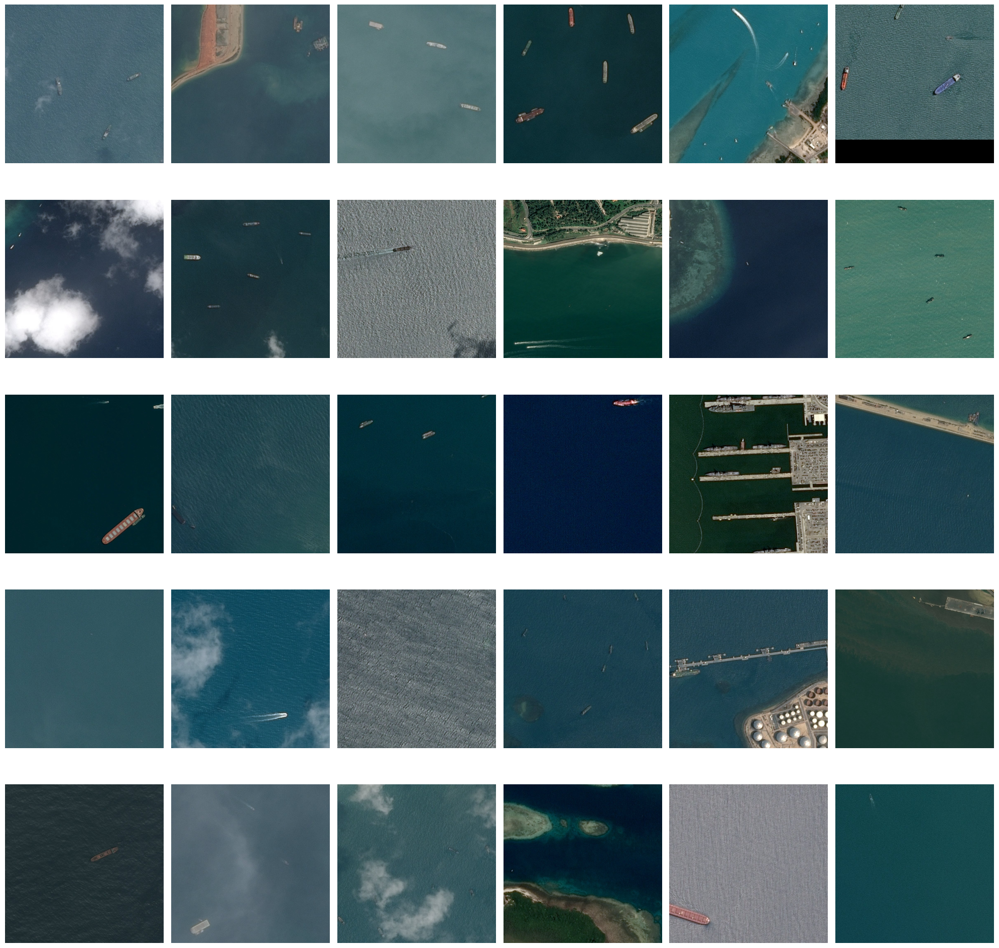

In [ ]:
# ships pictures
sample = df[~df.EncodedPixels.isna()].sample(30)

fig, ax = plt.subplots(5, 6, sharex='col', sharey='row')
fig.set_size_inches(20, 20)

for i, imgid in enumerate(sample.ImageId):
    row = i // 6
    col = i % 6
    
    path = Path(TRAIN_DIR) / imgid
    img = imread(path)
    
    ax[row, col].imshow(img)
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()

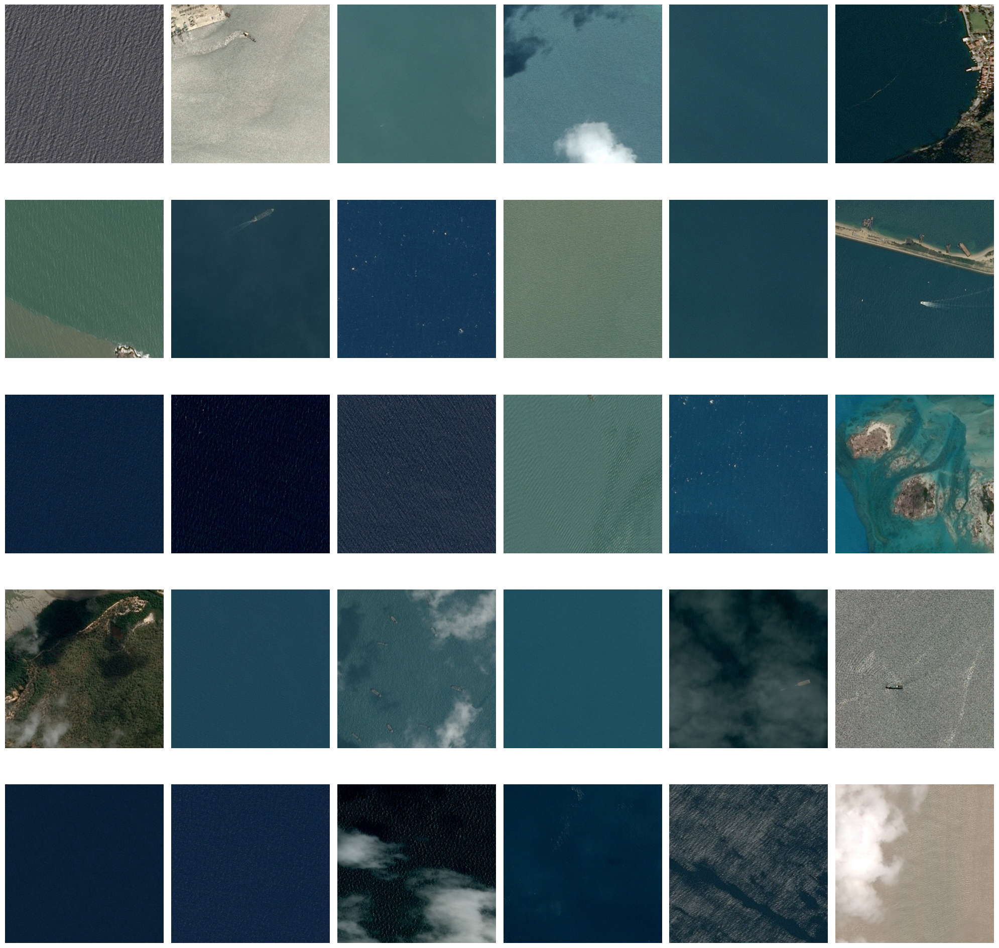

In [ ]:
#no ships pictures
sample = df.sample(30)

fig, ax = plt.subplots(5, 6, sharex='col', sharey='row')
fig.set_size_inches(20, 20)

for i, imgid in enumerate(sample.ImageId):
    row = i // 6
    col = i % 6
    
    path = Path(TRAIN_DIR) / imgid
    img = imread(path)
    
    ax[row, col].imshow(img)
    ax[row, col].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
df['Exist_ship'] = df['EncodedPixels'].apply(lambda count: 0 if pd.isna(count) else 1)

In [ ]:
df['Exist_ship'].replace({0:False, 1:True}).sum()

81723

In [ ]:
df['Exist_ship'] = df['EncodedPixels'].apply(lambda count: 0 if pd.isna(count) else 1)
df

,ImageId,EncodedPixels,Exist_ship
0,00003e153.jpg,NaN,0
1,0001124c7.jpg,NaN,0
2,000155de5.jpg,264661 17 265429 33 266197 33 266965 33 267733...,1
3,000194a2d.jpg,360486 1 361252 4 362019 5 362785 8 363552 10 ...,1
4,000194a2d.jpg,51834 9 52602 9 53370 9 54138 9 54906 9 55674 ...,1
...,...,...,...
231718,fffedbb6b.jpg,NaN,0
231719,ffff2aa57.jpg,NaN,0
231720,ffff6e525.jpg,NaN,0
231721,ffffc50b4.jpg,NaN,0


<Axes: ylabel='count'>

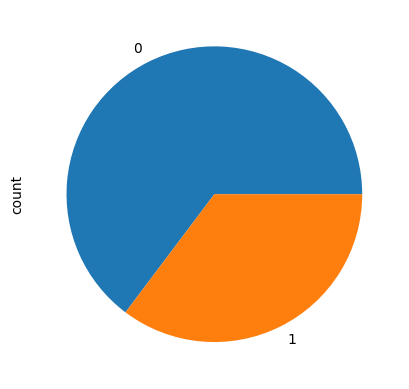

In [ ]:
df['Exist_ship'].value_counts().plot(kind='pie')

**We can see distribution of pictures with or without ships on them.**

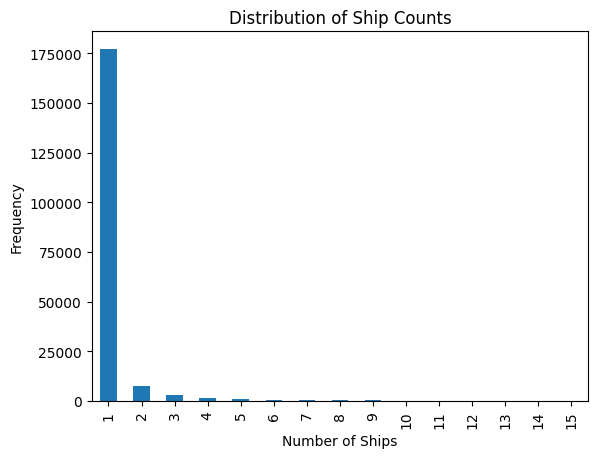

In [ ]:
ship_counts = df['ImageId'].value_counts()
ship_counts.value_counts().sort_index().plot(kind='bar')
plt.title("Distribution of Ship Counts")
plt.xlabel("Number of Ships")
plt.ylabel("Frequency")
plt.show()

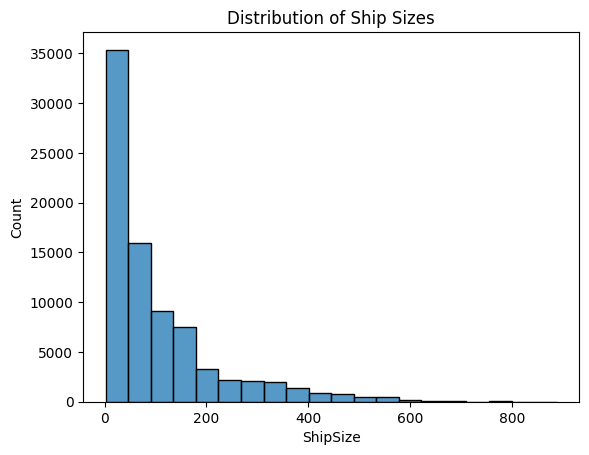

In [ ]:
# Plot the distribution of ship sizes
df['ShipSize'] = df['EncodedPixels'].str.split().str.len()
sns.histplot(data=df, x='ShipSize', bins=20)
plt.title('Distribution of Ship Sizes')
plt.show()

In [ ]:
# ref: https://www.kaggle.com/paulorzp/run-length-encode-and-decode
def rle_decode(mask_rle, shape=(768, 768)):
    '''
    mask_rle: run-length as string formatted (start length)
    shape: (height, width) of array to return 
    Returns numpy array, 1 - mask, 0 - background
    '''
    s = mask_rle.split()
    starts, lengths = [np.asarray(x, dtype=int) for x in (s[0:][::2], s[1:][::2])]
    starts -= 1
    ends = starts + lengths
    img = np.zeros(shape[0] * shape[1], dtype=np.uint8)
    for lo, hi in zip(starts, ends):
        img[lo:hi] = 1
    return img.reshape(shape).T  # Needed to align to RLE direction

def masks_as_color(in_mask_list):
    '''
    Draw ships in different colors
    '''
    # Take the individual ship masks and create a color mask array for each ship
    all_masks = np.zeros((768, 768, 3), dtype=np.float)
    scale = lambda x: (len(in_mask_list) + x + 1) / (len(in_mask_list) * 2)  # Scale the heatmap image to shift 
    for i, mask in enumerate(in_mask_list):
        if isinstance(mask, str):
            all_masks[:, :, 0] += scale(i) * rle_decode(mask)
    all_masks = np.clip(all_masks, 0, 1)  # Clip values between 0 and 1
    return all_masks

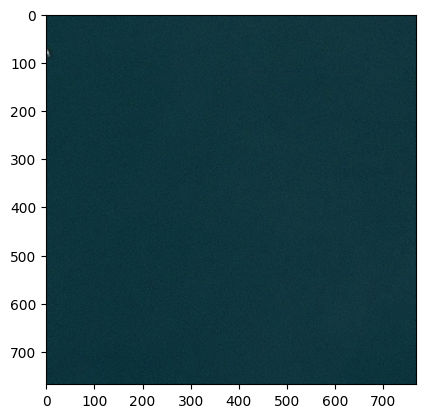

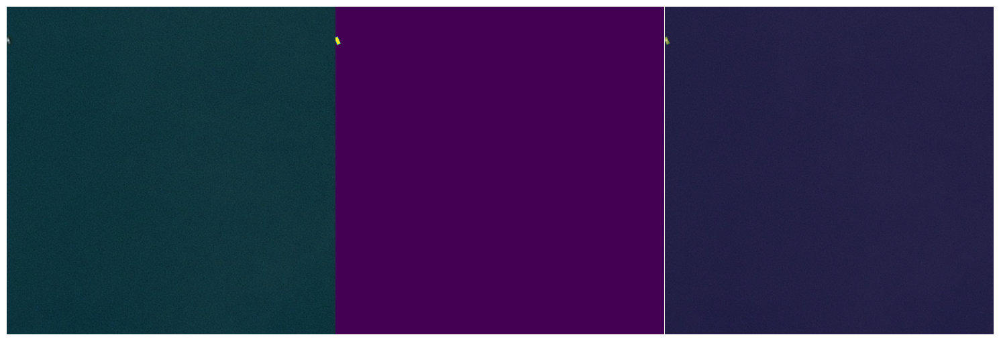

In [ ]:
while True:
    try:
        IMG = TRAIN[np.random.randint(1000)]
        img = imread(TRAIN_DIR + "/" + IMG)
        #path = Path(TRAIN_DIR) / imgid
        #img = imread(path)

        plt.imshow(img)

        img_masks = df.loc[df['ImageId'] == IMG, 'EncodedPixels'].tolist()

        all_masks = np.zeros((768, 768))
        for mask in img_masks:
            all_masks += rle_decode(mask)

        fig, axarr = plt.subplots(1, 3, figsize=(15, 40))
        axarr[0].axis('off')
        axarr[1].axis('off')
        axarr[2].axis('off')
        axarr[0].imshow(img)
        axarr[1].imshow(all_masks)
        axarr[2].imshow(img)
        axarr[2].imshow(all_masks, alpha=0.4)
        plt.tight_layout(h_pad=0.1, w_pad=0.1)
        plt.show()
        break
    except AttributeError as error:
        print('-')

C:\Users\mariy\AppData\Local\Temp\ipykernel_29732\2032501455.py:22: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  all_masks = np.zeros((768, 768, 3), dtype=np.float)


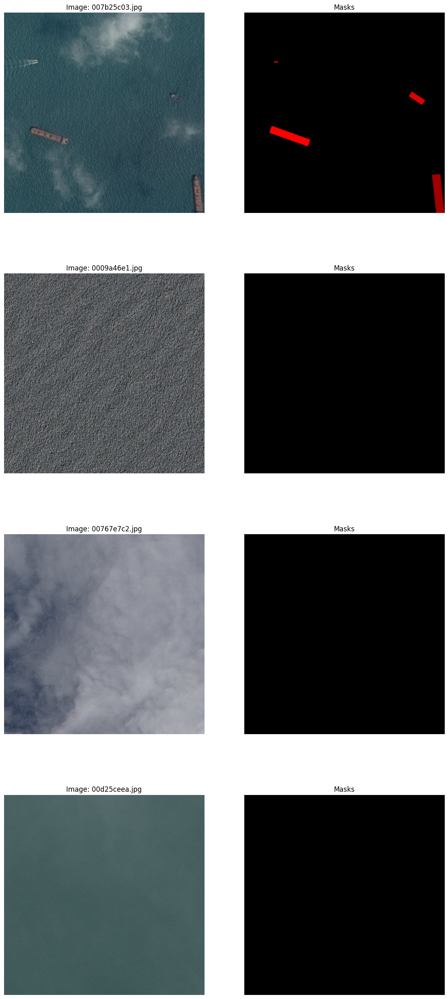

In [ ]:
# compare pairs of images (original/mask) 
val = [np.random.randint(1000) for i in range(4)]

TOP_PREDICTIONS = 4
fig, m_axs = plt.subplots(TOP_PREDICTIONS, 2, figsize = (14, TOP_PREDICTIONS*8))
[c_ax.axis('off') for c_ax in m_axs.flatten()]

def raw_prediction(img, path=TRAIN_DIR):
    c_img = imread(os.path.join(path, c_img_name))
    c_img = np.expand_dims(c_img, 0)/255.0
    return c_img[0]

for (ax1, ax2), c_img_name in zip(m_axs, df.ImageId.loc[val]):
    c_img = raw_prediction(c_img_name)
    ax1.imshow(c_img)
    ax1.set_title('Image: ' + c_img_name)
    ax2.imshow(masks_as_color(df.query('ImageId==\"{}\"'.format(c_img_name))['EncodedPixels']))
    ax2.set_title('Masks')